### Forest Cover Type

**Dataset Description**

1. Elevation - Elevation in meters

2. Aspect - Aspect in degrees azimuth

3. Slope - Slope in degrees

4. Horizontal_Distance_To_Hydrology - Horz Dist to nearest surface water features

5. Vertical_Distance_To_Hydrology - Vert Dist to nearest surface water features

6. Horizontal_Distance_To_Roadways - Horz Dist to nearest roadway

7. Hillshade_9am - Hillshade index at 9am, summer solstice

8. Hillshade_Noon - Hillshade index at noon, summer soltice

9. Hillshade_3pm - Hillshade index at 3pm, summer solstice

10. Horizontal_Distance_To_Fire_Points - Horz Dist to nearest wildfire ignition points

11. Wilderness_Area (4 binary columns) - Wilderness area designation

12. Soil_Type (40 binary columns) - Soil Type designation

13. Cover_Type (7 types) - Forest Cover Type designation

### 1. Import the relevant packages and Read the dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [53]:
# Reading the dataset

url = 'C:/Users/Nikhil Jain/Desktop/Code/Boosting/covtype.csv'
forest = pd.read_csv(url)

In [54]:
#Checking the iport of data

forest.head(5)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


### 2. Explore the Dataset

In [5]:
#Values count for cover_type column

forest['Cover_Type'].value_counts()

2    283301
1    211840
3     35754
7     20510
6     17367
5      9493
4      2747
Name: Cover_Type, dtype: int64

In [6]:
#Shape of the dataset

forest.shape

(581012, 55)

In [7]:
#Info of the dataset

forest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 55 columns):
 #   Column                              Non-Null Count   Dtype
---  ------                              --------------   -----
 0   Elevation                           581012 non-null  int64
 1   Aspect                              581012 non-null  int64
 2   Slope                               581012 non-null  int64
 3   Horizontal_Distance_To_Hydrology    581012 non-null  int64
 4   Vertical_Distance_To_Hydrology      581012 non-null  int64
 5   Horizontal_Distance_To_Roadways     581012 non-null  int64
 6   Hillshade_9am                       581012 non-null  int64
 7   Hillshade_Noon                      581012 non-null  int64
 8   Hillshade_3pm                       581012 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  581012 non-null  int64
 10  Wilderness_Area1                    581012 non-null  int64
 11  Wilderness_Area2                    581012 non-null 

### 3. Perform the Descriptive Statistics for the dataset

In [8]:
# Summary statistics for the dataset
forest.describe()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,...,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226,...,0.090392,0.077716,0.002773,0.003255,0.000205,0.000513,0.026803,0.023762,0.015060,2.051471
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210,...,0.286743,0.267725,0.052584,0.056957,0.014310,0.022641,0.161508,0.152307,0.121791,1.396504
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,7173.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


**We could see that the max and min for all the columns are different and also standard deviation varies abruptly so scaling should be done**

### 4. Check for null values and if any are present do the null value treatment

In [9]:
# Checking for null values
forest.isnull().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


**We could see that there are no null values present in the dataset**

In [10]:
import pandas_profiling
report=pandas_profiling.ProfileReport(forest)
report

### 5. Perform EDA for the dataset

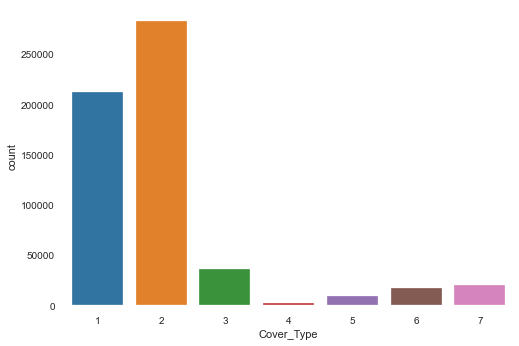

In [11]:
# Count plot for COVER TYPE column
sns.countplot(x=forest['Cover_Type'])

**We could see of all the 7 forest types,type 2 as the most count of forests**

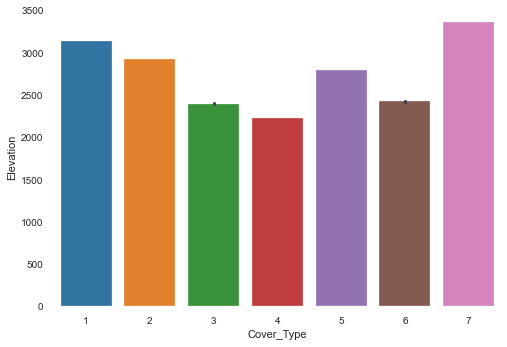

In [12]:
# Bar plot for COVER TYPE vs ELEVATION columns
sns.barplot(x='Cover_Type',y='Elevation',data=forest)

**We could type 7 has a lot more Elevation followed by type 1 and type 2 forests**

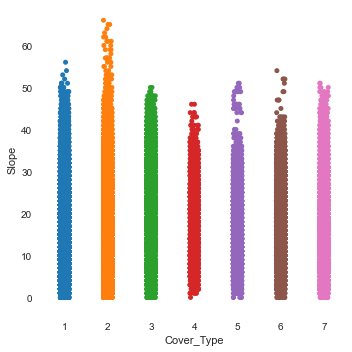

In [13]:
# Cat plot for COVER TYPE vs SLOPE columns
sns.catplot(x='Cover_Type',y='Slope',data=forest)

**We could see for the types 2 forests the Slope is very much high followed by forest types 1 and 3**

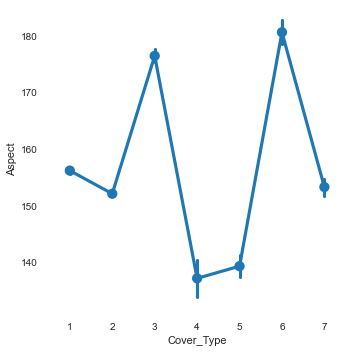

In [14]:
# Strip plot for COVER TYPE vs Aspect
sns.factorplot(x='Cover_Type',y='Aspect',data=forest)

**We could for the forest types 3 and 4 the Aspect ratio is very much high**

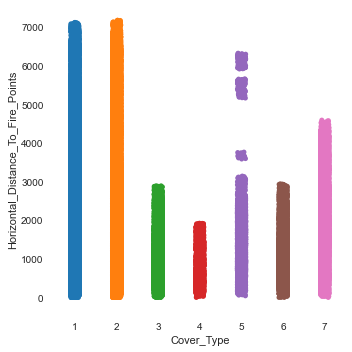

In [15]:
# Cat plot for COVER_TYPE vs HORIZONTAL_DISTANCE_TO_FIRE_POINTS columns
sns.catplot(x='Cover_Type',y='Horizontal_Distance_To_Fire_Points',data=forest)

**We could see the Horizontal Distance to Fire Points is high for forest types 1,2 and 7 so these forests are highly prone to forest fires**

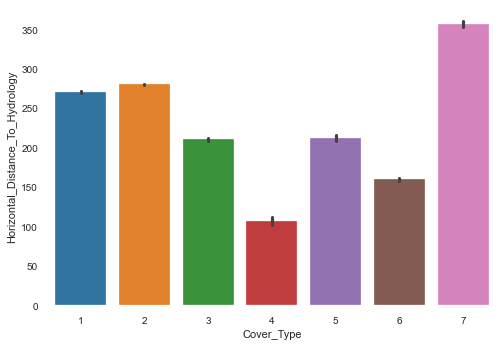

In [16]:
# Bar plot for COVER TYPE vs HORIZONTAL_DISTANCE_TO_HYDROLOGY
sns.barplot(x='Cover_Type',y='Horizontal_Distance_To_Hydrology',data=forest)

**We could see that the forest types 7,2 and 1 the Horizontal Distance to Hydrology is high so for Type 2 forest inspite of high distance of Fire Points its till safe from Fire Points as Hydrology is high and also this for Type 1**

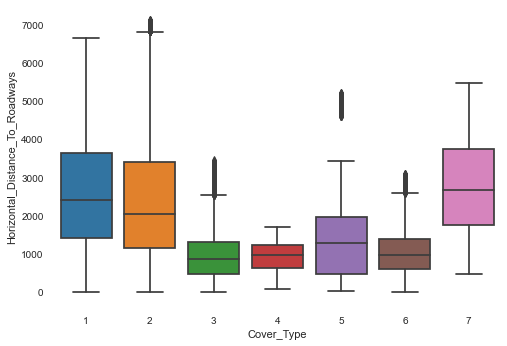

In [17]:
# Box plot for COVER TYPE vs HORIZONTAL_DISTANCE_TO_ROADWAYS
sns.boxplot(x='Cover_Type',y='Horizontal_Distance_To_Roadways',data=forest)

**We could see for the forest types 1,2 and 7 the Horizontal Distance to Roadways is high,so people using these Roadways should be careful during storms**

### 6. Perform all the regular ML models and then Boosting models and analyze the metrics

In [75]:
# Assigning x and y variables for model building
x = forest.drop('Cover_Type',1)
y = forest['Cover_Type']

In [76]:
# Scaling the x values using Standard Scaler and converting the scaled values to dataframe
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
x_scaled = ss.fit_transform(x)

x_scaled = pd.DataFrame(x_scaled,columns=x.columns)

In [77]:
# Importing the train_test_split for splitting the dataset
from sklearn.model_selection import train_test_split

In [78]:
# Splitting the dataset to train and test
x_train,x_test,y_train,y_test = train_test_split(x,y,random_state=2,test_size=0.25)

### Performing Decision Tree Classification and analyzing the metrics

In [22]:
# Importing the DecisionTreeClassifier and fitting the model
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)
pred = dt.predict(x_test)

In [23]:
# Importing the metrics for evaluation
from sklearn import metrics

In [24]:
# Classification Report
print(metrics.classification_report(pred,y_test))

              precision    recall  f1-score   support

           1       0.94      0.94      0.94     53139
           2       0.95      0.95      0.95     70904
           3       0.92      0.93      0.93      8867
           4       0.81      0.85      0.83       644
           5       0.82      0.83      0.83      2324
           6       0.87      0.87      0.87      4299
           7       0.94      0.95      0.94      5076

   micro avg       0.94      0.94      0.94    145253
   macro avg       0.89      0.90      0.90    145253
weighted avg       0.94      0.94      0.94    145253



In [25]:
# Confusion Matrix
metrics.confusion_matrix(pred,y_test)

array([[49831,  2978,     6,     0,    58,     8,   258],
       [ 3137, 67024,   216,     0,   334,   153,    40],
       [    5,   179,  8234,    85,    15,   349,     0],
       [    0,     3,    66,   550,     0,    25,     0],
       [   52,   295,    31,     0,  1934,    12,     0],
       [    8,   157,   350,    46,    10,  3728,     0],
       [  243,    33,     0,     0,     2,     0,  4798]], dtype=int64)

In [26]:
# Accuracy score
dt_acc = metrics.accuracy_score(pred,y_test)
dt_acc

0.9369789264249275

In [27]:
# Cohen kappa score
dt_cohen = metrics.cohen_kappa_score(pred,y_test)
dt_cohen

0.8987136321104889

In [28]:
# Train score
dt_train = dt.score(x_train,y_train)
dt_train

1.0

In [29]:
# Test score
dt_test = dt.score(x_test,y_test)
dt_test

0.9369789264249275

### Performing Random Forest Classification and analyzing the metrics

In [30]:
# Importing the Random Forest Classifier and fitting the model
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)
pred1 = rf.predict(x_test)

In [31]:
# Confusion matrix for Random Forest
metrics.confusion_matrix(pred1,y_test)

array([[50233,  2843,     9,     0,    45,     9,   333],
       [ 2886, 67469,   228,     0,   570,   158,    40],
       [    2,   134,  8429,   103,    28,   455,     0],
       [    0,     3,    31,   553,     0,    14,     0],
       [   14,    87,     7,     0,  1704,     6,     1],
       [    9,   111,   199,    25,     6,  3633,     0],
       [  132,    22,     0,     0,     0,     0,  4722]], dtype=int64)

In [32]:
# Classification Report for Random Forest
print(metrics.classification_report(pred1,y_test))

              precision    recall  f1-score   support

           1       0.94      0.94      0.94     53472
           2       0.95      0.95      0.95     71351
           3       0.95      0.92      0.93      9151
           4       0.81      0.92      0.86       601
           5       0.72      0.94      0.82      1819
           6       0.85      0.91      0.88      3983
           7       0.93      0.97      0.95      4876

   micro avg       0.94      0.94      0.94    145253
   macro avg       0.88      0.93      0.90    145253
weighted avg       0.94      0.94      0.94    145253



In [33]:
# Accuracy score for Random Forest
rf_acc = metrics.accuracy_score(pred1,y_test)
rf_acc

0.941412569792018

In [34]:
# Cohen kappa score for Random Forest
rf_cohen = metrics.cohen_kappa_score(pred1,y_test)
rf_cohen

0.9054917952110658

In [35]:
# Train score for Random Forest
rf_train = rf.score(x_train,y_train)
rf_train

0.9976408978357303

In [36]:
# Test score for Random Forest
rf_test = rf.score(x_test,y_test)
rf_test

0.941412569792018

### Performing KNearest Neighbors and analyzing the metrics

In [37]:
# Importing KNN and fitting the model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)
knn_pred = knn.predict(x_test)

In [38]:
# Confusion matrix for KNN
metrics.confusion_matrix(knn_pred,y_test)

array([[51445,  1400,     2,     0,    21,     0,   149],
       [ 1679, 68956,   120,     1,   208,   108,    36],
       [    3,    86,  8575,    93,    21,   173,     0],
       [    0,     1,    35,   530,     0,    14,     0],
       [   23,   144,     9,     0,  2096,    11,     0],
       [    2,    64,   162,    57,     6,  3969,     0],
       [  124,    18,     0,     0,     1,     0,  4911]], dtype=int64)

In [39]:
# Classification Report for KNN
print(metrics.classification_report(knn_pred,y_test))

              precision    recall  f1-score   support

           1       0.97      0.97      0.97     53017
           2       0.98      0.97      0.97     71108
           3       0.96      0.96      0.96      8951
           4       0.78      0.91      0.84       580
           5       0.89      0.92      0.90      2283
           6       0.93      0.93      0.93      4260
           7       0.96      0.97      0.97      5054

   micro avg       0.97      0.97      0.97    145253
   macro avg       0.92      0.95      0.93    145253
weighted avg       0.97      0.97      0.97    145253



In [40]:
# Accuracy score for KNN
knn_acc = metrics.accuracy_score(knn_pred,y_test)
knn_acc

0.9671538625708247

In [41]:
# Cohen kappa score for KNN
knn_cohen = metrics.cohen_kappa_score(knn_pred,y_test)
knn_cohen

0.9471770826776373

In [42]:
# Train score for KNN
knn_train = knn.score(x_train,y_train)
knn_train

0.9839039469064322

In [43]:
# Test score for KNN
knn_test = knn.score(x_test,y_test)
knn_test

0.9671538625708247

### Performing Logistic Regression and fitting the model

In [59]:
# Importing the Logistic Regression and fitting the model
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(solver='newton-cg',multi_class='multinomial')
lr.fit(x_train,y_train)
lr_pred = lr.predict(x_test)

In [45]:
# Confusion matrix for Logistic Regression
metrics.confusion_matrix(lr_pred,y_test)

array([[37273, 13110,     0,     0,    19,     1,  2706],
       [15181, 56205,  1225,    10,  2277,  1091,    44],
       [    3,   890,  6859,   353,    45,  2195,     0],
       [    0,     0,   120,   202,     0,     6,     0],
       [    0,     0,     5,     2,     0,     0,     0],
       [   10,   390,   693,   114,    10,   982,     0],
       [  809,    74,     1,     0,     2,     0,  2346]], dtype=int64)

In [46]:
# Accuracy score for Logistic Regression
lr_acc = metrics.accuracy_score(lr_pred,y_test)
lr_acc

0.7150764528099247

In [47]:
# Cohen kappa score for Logistic Regression
lr_cohen = metrics.cohen_kappa_score(lr_pred,y_test)
lr_cohen

0.5295332668951886

In [48]:
# Classification Report for Logistic Regression
print(metrics.classification_report(lr_pred,y_test))

              precision    recall  f1-score   support

           1       0.70      0.70      0.70     53109
           2       0.80      0.74      0.77     76033
           3       0.77      0.66      0.71     10345
           4       0.30      0.62      0.40       328
           5       0.00      0.00      0.00         7
           6       0.23      0.45      0.30      2199
           7       0.46      0.73      0.56      3232

   micro avg       0.72      0.72      0.72    145253
   macro avg       0.46      0.56      0.49    145253
weighted avg       0.74      0.72      0.73    145253



In [49]:
# Train score for Logistic Regression
lr_train = lr.score(x_train,y_train)
lr_train

0.7174722725176073

In [50]:
# Test score for Logistic Regression
lr_test = lr.score(x_test,y_test)
lr_test

0.7150764528099247

### Performing Ada Boost Classification and analyzing the metrics

In [66]:
# Importing Ada Boost Classifier and fitting the model
from sklearn.ensemble import AdaBoostClassifier
ab = AdaBoostClassifier()
ab.fit(x_train,y_train)
pred2 = ab.predict(x_test)

In [67]:
# Confusion matrix for Ada Boost
metrics.confusion_matrix(pred2,y_test)

array([[41459, 33671,   100,     0,   246,    23,  3768],
       [ 5319, 30414,  1522,     0,  2024,   702,    19],
       [   29,   674,  1495,     2,     5,   678,     0],
       [    0,     0,     0,     0,     0,     0,     0],
       [    0,     0,     0,     0,     0,     0,     0],
       [  230,  2951,  5786,   679,    77,  2872,     0],
       [ 6239,  2959,     0,     0,     1,     0,  1309]], dtype=int64)

In [68]:
# Classification Report for Ada Boost
print(metrics.classification_report(pred2,y_test))

              precision    recall  f1-score   support

           1       0.78      0.52      0.63     79267
           2       0.43      0.76      0.55     40000
           3       0.17      0.52      0.25      2883
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.67      0.23      0.34     12595
           7       0.26      0.12      0.17     10508

   micro avg       0.53      0.53      0.53    145253
   macro avg       0.33      0.31      0.28    145253
weighted avg       0.62      0.53      0.54    145253



In [69]:
# Accuracy score for Ada Boost
ab_acc = metrics.accuracy_score(pred2,y_test)
ab_acc

0.5338891451467439

In [70]:
# Cohen kappa score for Ada Boost
ab_cohen = metrics.cohen_kappa_score(pred2,y_test)
ab_cohen

0.2932953443462978

In [71]:
# Train score for Ada Boost
ab_train = ab.score(x_train,y_train)
ab_train

0.5339832338517392

In [72]:
# Test score for Ada Boost 
ab_test = ab.score(x_test,y_test)
ab_test

0.5338891451467439

### Performing Gradient Boosting Classification and analyzing the metrics

In [79]:
# Importing Gradient Boosting Classifier and fitting the model
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier()
gb.fit(x_train,y_train)
pred3 = gb.predict(x_test)

In [80]:
# Confusion matrix for Gradient Boosting Classifier
metrics.confusion_matrix(pred3,y_test)

array([[39623, 11226,     0,     0,    14,     0,  1497],
       [13150, 58353,   868,     0,  1794,   928,    44],
       [    8,   530,  7416,   161,    64,  1463,     0],
       [    0,     4,    71,   487,     0,    17,     0],
       [   21,   107,     4,     0,   480,     0,     0],
       [   16,   429,   544,    33,     1,  1867,     0],
       [  458,    20,     0,     0,     0,     0,  3555]], dtype=int64)

In [81]:
# Classification Report for Gradient Boosting Classifier
print(metrics.classification_report(pred3,y_test))

              precision    recall  f1-score   support

           1       0.74      0.76      0.75     52360
           2       0.83      0.78      0.80     75137
           3       0.83      0.77      0.80      9642
           4       0.72      0.84      0.77       579
           5       0.20      0.78      0.32       612
           6       0.44      0.65      0.52      2890
           7       0.70      0.88      0.78      4033

   micro avg       0.77      0.77      0.77    145253
   macro avg       0.64      0.78      0.68    145253
weighted avg       0.78      0.77      0.77    145253



In [82]:
# Accuracy score for Gradient Boosting Classifier
gb_acc = metrics.accuracy_score(pred3,y_test)
gb_acc

0.769560697541531

In [83]:
# Cohen kappa score for Gradient Boosting Classifier
gb_cohen = metrics.cohen_kappa_score(pred3,y_test)
gb_cohen

0.6224775590763774

In [84]:
# Train score for Gradient Boosting Classifier
gb_train = gb.score(x_train,y_train)
gb_train

0.7730855817091558

In [85]:
# Test score for Gradient Boosting Classifier
gb_test = gb.score(x_test,y_test)
gb_test

0.769560697541531

### Performing XG Boost Classification and analyzing the metrics

In [86]:
# Importing the XG Boost Classifier
from xgboost.sklearn import XGBClassifier

In [87]:
# Fitting the model
xgb_model = XGBClassifier() 

In [88]:
# Training the model
xgb_model.fit(x_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
       importance_type='gain', interaction_constraints='',
       learning_rate=0.300000012, max_delta_step=0, max_depth=6,
       min_child_weight=1, missing=nan, monotone_constraints='()',
       n_estimators=100, n_jobs=0, num_parallel_tree=1,
       objective='multi:softprob', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=None, subsample=1,
       tree_method='exact', validate_parameters=1, verbosity=None)

In [89]:
# Testing the model
pred4 = xgb_model.predict(x_test)

In [90]:
# Confusion matrix for XG Boost
metrics.confusion_matrix(pred4,y_test)

array([[44645,  6627,     2,     0,    28,     5,   392],
       [ 8372, 63401,   359,     0,   959,   252,    25],
       [    1,   267,  8118,    61,    42,   557,     0],
       [    0,     3,    44,   591,     0,    12,     0],
       [   27,   134,     0,     0,  1319,     3,     0],
       [    9,   210,   380,    29,     5,  3446,     0],
       [  222,    27,     0,     0,     0,     0,  4679]], dtype=int64)

In [91]:
# Accuracy score for XG Boost
xgb_acc = metrics.accuracy_score(pred4,y_test)
xgb_acc

0.8688219864649955

In [92]:
# Cohen kappa score for XG Boost
xgb_cohen = metrics.cohen_kappa_score(pred4,y_test)
xgb_cohen

0.7876307225005286

In [93]:
# Train score for XG Boost
xgb_train = xgb_model.score(x_train,y_train)
xgb_train

0.880849276779137

In [94]:
# Test score for XG Boost
xgb_test = xgb_model.score(x_test,y_test)
xgb_test

0.8688219864649955

### Performing LightGBM Classification and analyzing the metrics

In [95]:
import lightgbm as lgb

lightgb = lgb.LGBMClassifier()
lightgb.fit(x_train,y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=-1,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [96]:
pred5 = lightgb.predict(x_test)

In [97]:
# Confusion matrix for Light GBM
metrics.confusion_matrix(pred5,y_test)

array([[42131,  8433,     0,     0,    13,     3,   681],
       [10744, 61275,   445,     0,  1010,   353,    24],
       [    2,   447,  7963,    92,    43,   746,     0],
       [    0,     5,    60,   564,     0,    24,     0],
       [   29,   139,     3,     0,  1280,     2,     1],
       [    7,   339,   432,    25,     7,  3147,     0],
       [  363,    31,     0,     0,     0,     0,  4390]], dtype=int64)

In [98]:
# Classification Report for Light GBM
print(metrics.classification_report(pred5,y_test))

              precision    recall  f1-score   support

           1       0.79      0.82      0.81     51261
           2       0.87      0.83      0.85     73851
           3       0.89      0.86      0.88      9293
           4       0.83      0.86      0.85       653
           5       0.54      0.88      0.67      1454
           6       0.74      0.80      0.76      3957
           7       0.86      0.92      0.89      4784

   micro avg       0.83      0.83      0.83    145253
   macro avg       0.79      0.85      0.81    145253
weighted avg       0.83      0.83      0.83    145253



In [99]:
# Accuracy score for Light GBM
light_acc = metrics.accuracy_score(pred5,y_test)
light_acc

0.8313081313294735

In [100]:
# Cohen kappa score for Light GBM
light_cohen = metrics.cohen_kappa_score(pred5,y_test)
light_cohen

0.7266531639759795

In [101]:
# Train score for Light GBM
light_train = lightgb.score(x_train,y_train)
light_train

0.8382752851920442

In [102]:
# Test score for Light GBM
light_test = lightgb.score(x_test,y_test)
light_test

0.8313081313294735

### 7. Create a dataframe of all the models with their metrics and compare the scores between each models

In [104]:
# Creating dictionary for all the metrics and models
metrics = {'Metrics': ['Train Score','Test Score','Accuracy Score','Cohen kappa score'],'Logistic Regression':[lr_train,lr_test,lr_acc,lr_cohen],
          'Decision Tree Classifier':[dt_train,dt_test,dt_acc,dt_cohen],'Random Forest Classifier':[rf_train,rf_test,rf_acc,rf_cohen],'Light GBM Classifier':[light_train,light_test,light_acc,light_cohen],
          'KNearestNeighbor Classifier':[knn_train,knn_test,knn_acc,knn_cohen],
          'XG Boost Classifier':[xgb_train,xgb_test,xgb_acc,xgb_cohen],
          'Ada Boost Classifier':[ab_train,ab_test,ab_acc,ab_cohen],
          'Gradient Boosting Classifier':[gb_train,gb_test,gb_acc,gb_cohen]}

In [105]:
# Creating dataframe for all the metrics and models
metrics = pd.DataFrame(metrics)
metrics

,Metrics,Logistic Regression,Decision Tree Classifier,Random Forest Classifier,Light GBM Classifier,KNearestNeighbor Classifier,XG Boost Classifier,Ada Boost Classifier,Gradient Boosting Classifier
0,Train Score,0.717472,1.000000,0.997641,0.838275,0.983904,0.880849,0.533983,0.773086
1,Test Score,0.715076,0.936979,0.941413,0.831308,0.967154,0.868822,0.533889,0.769561
2,Accuracy Score,0.715076,0.936979,0.941413,0.831308,0.967154,0.868822,0.533889,0.769561
3,Cohen kappa score,0.529533,0.898714,0.905492,0.726653,0.947177,0.787631,0.293295,0.622478


### 8. Give the final inference for the models you have created

We could confirm from the dataframe that the models KNearestNeighbors,Light GBM and Random Forest are the best models. Decision tree is ignored because it seems like an overfitted model.